In [1]:
import pandas as pd
import numpy as np
import time
import xgboost as xgb
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.utils import resample
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from joblib import dump, load
from sklearn.metrics import precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import logging
# Set logging level to suppress warnings
logging.basicConfig(level=logging.ERROR)

# Load Dataset & Feature Selection

In [3]:
# Load dataset
df = pd.read_csv('data.csv')
# Select relevant columns
df = df[['B', 'Br', 'Cl', 'K', 'Sr', 'Na', 'Li']]

# Data preprocessing
# Drop rows with any NaN values
df = df.dropna(axis=0, how='any')

df.head()

/var/folders/2l/q8wm67_x5yn9qtfylfw_gktc0000gn/T/ipykernel_31507/3691372692.py:2: DtypeWarning: Columns (1,10,18,21,22,24,25,26,27,28,33,35,39,44,45,46,203,205,207) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('data.csv')


,B,Br,Cl,K,Sr,Na,Li
265,5.2,2.20,1144.0,36.0,1.60,853.0,1.50
329,48.0,1.50,877.0,65.0,0.67,662.0,1.30
342,11.8,0.53,223.0,22.0,0.14,168.0,1.98
344,41.8,1.46,853.0,64.0,0.48,690.0,6.10
347,41.3,1.40,843.0,80.0,0.52,672.0,6.98


## Binning

In [4]:
bins = [0, 70, 200, float('inf')]
labels = ['low', 'medium', 'high']
df['Li_class'] = pd.cut(df['Li'], bins=bins, labels=labels, right=True)
df.head()

,B,Br,Cl,K,Sr,Na,Li,Li_class
265,5.2,2.20,1144.0,36.0,1.60,853.0,1.50,low
329,48.0,1.50,877.0,65.0,0.67,662.0,1.30,low
342,11.8,0.53,223.0,22.0,0.14,168.0,1.98,low
344,41.8,1.46,853.0,64.0,0.48,690.0,6.10,low
347,41.3,1.40,843.0,80.0,0.52,672.0,6.98,low


In [5]:
# Map class labels to integers
df['Li_class'] = df['Li_class'].map({'low': 0, 'medium': 1, 'high': 2}).astype(int)
df.head()

,B,Br,Cl,K,Sr,Na,Li,Li_class
265,5.2,2.20,1144.0,36.0,1.60,853.0,1.50,0
329,48.0,1.50,877.0,65.0,0.67,662.0,1.30,0
342,11.8,0.53,223.0,22.0,0.14,168.0,1.98,0
344,41.8,1.46,853.0,64.0,0.48,690.0,6.10,0
347,41.3,1.40,843.0,80.0,0.52,672.0,6.98,0


In [6]:
# Preserve the Na_class for later (it must stay based on the original 'Na' values)
li_class = df['Li_class'].copy()

# Store original data before log transformation
original_df = df.copy()

# Apply log transformation to the features (except 'Li' and 'Li_class')
df[['B', 'Br', 'Cl', 'K', 'Sr', 'Na']] = df[['B', 'Br', 'Cl', 'K', 'Sr', 'Na']].apply(np.log10)

# Reassign 'Na_class' back to the dataframe to keep it intact
df['Li_class'] = li_class

# Drop 'Na' column since it's no longer needed
df = df.drop(columns='Li')
original_df = original_df.drop(columns=['Li_class'])

## Rebalancing

Li_class
0    1555
1     176
2      70
Name: count, dtype: int64


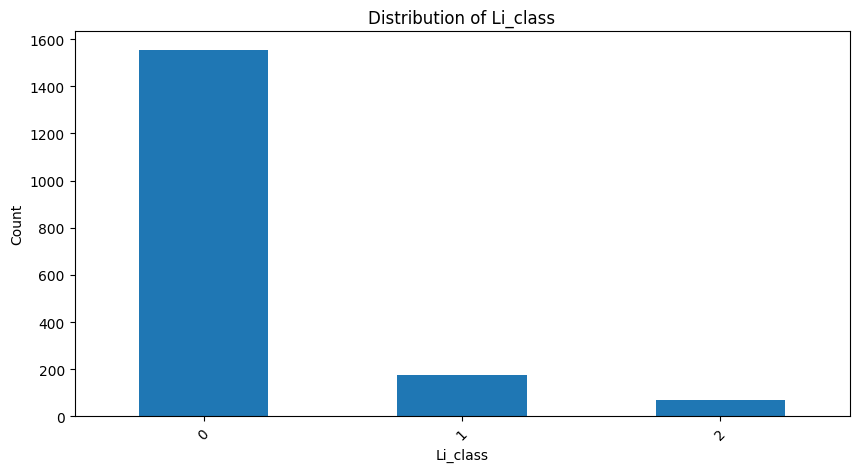

In [7]:
import pandas as pd
import matplotlib.pyplot as plt

# Sample DataFrame (replace with your actual DataFrame)
# df = pd.read_csv("your_data.csv")

# Count occurrences of each class
class_counts = df['Li_class'].value_counts()

# Display counts
print(class_counts)

# Plot distribution
plt.figure(figsize=(10, 5))
class_counts.plot(kind='bar')
plt.xlabel("Li_class")
plt.ylabel("Count")
plt.title("Distribution of Li_class")
plt.xticks(rotation=45)
plt.show()


In [8]:
# !pip install ImbalancedDatasetSampler

In [9]:
from torchsampler import ImbalancedDatasetSampler
import torch.utils.data
from torch.utils.data import Dataset, DataLoader

In [10]:
from torch.utils.data import Dataset
from torchsampler import ImbalancedDatasetSampler
import torch

class CustomDataset(Dataset):
    def __init__(self, df):
        self.df = df
        self.features = df.drop('Li_class', axis=1).values
        self.labels = df['Li_class'].values

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        x = torch.tensor(self.features[idx], dtype=torch.float32)
        y = torch.tensor(self.labels[idx], dtype=torch.long)
        return x, y

    def get_labels(self):
        return self.labels

custom_dataset = CustomDataset(df)

In [11]:
from torch.utils.data import DataLoader

sampler = ImbalancedDatasetSampler(custom_dataset)
balanced_loader = DataLoader(custom_dataset, sampler=sampler, batch_size=len(custom_dataset))

In [12]:
balanced_data = next(iter(balanced_loader))
balanced_labels = balanced_data[1].numpy()

class_distribution_after = pd.Series(balanced_labels).value_counts(normalize=True)
print("Class Distribution After Sampling:")
print(class_distribution_after)


Class Distribution After Sampling:
2    0.350361
1    0.328151
0    0.321488
Name: proportion, dtype: float64


In [13]:
# Extract the entire resampled dataset
for batch in balanced_loader:
    features, labels = batch
    break  # since we only need one batch which contains the entire dataset

# Convert tensors to numpy arrays
features_np = features.numpy()
labels_np = labels.numpy()

# Define feature names
feature_names = ['B', 'Br', 'Cl', 'K', 'Sr', 'Na']

# Create a DataFrame for features
features_df = pd.DataFrame(features_np, columns=feature_names)

# Create a DataFrame for labels
labels_df = pd.DataFrame(labels_np, columns=['Li_class'])

# Combine features and labels into a single DataFrame
resampled_df = pd.concat([features_df, labels_df], axis=1)


In [14]:
resampled_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1801 entries, 0 to 1800
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   B         1801 non-null   float32
 1   Br        1801 non-null   float32
 2   Cl        1801 non-null   float32
 3   K         1801 non-null   float32
 4   Sr        1801 non-null   float32
 5   Na        1801 non-null   float32
 6   Li_class  1801 non-null   int64  
dtypes: float32(6), int64(1)
memory usage: 56.4 KB


In [15]:
resampled_df.head()

,B,Br,Cl,K,Sr,Na,Li_class
0,2.285557,3.742804,5.271479,3.181844,3.354300,4.838339,1
1,2.471292,2.933487,5.276462,3.748188,3.697229,4.889302,2
2,1.408240,3.033424,5.029384,2.751279,3.569374,4.733197,1
3,1.555094,3.414472,5.309626,3.253096,3.174351,4.863680,1
4,2.214844,3.820136,5.308765,3.309204,3.433290,4.869232,1


# Classifier Training

## Hyperparameter Optimisation

In [16]:
# !pip install optuna

In [16]:
import optuna
import numpy as np
import pandas as pd
import time
from joblib import dump, load

from sklearn.model_selection import cross_val_score, StratifiedKFold, train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

optuna.logging.set_verbosity(optuna.logging.ERROR)

# Assume resampled_df is already defined, so split into train/validation:
X_resampled = resampled_df.drop(columns='Li_class')
y_resampled = resampled_df['Li_class']

X_train, X_val, y_train, y_val = train_test_split(
    X_resampled, y_resampled, test_size=0.2, random_state=259, stratify=y_resampled
)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Objective Functions

Define Extensive Objective Functions for Optuna 

In [17]:
# RandomForest Objective with additional parameters
def objective_rf(trial):
    n_estimators = trial.suggest_int('n_estimators', 100, 1000)
    max_depth = trial.suggest_int('max_depth', 5, 50)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 20)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 10)
    max_features = trial.suggest_categorical('max_features', ['sqrt', 'log2', None])
    criterion = trial.suggest_categorical('criterion', ['gini', 'entropy'])
    
    clf = RandomForestClassifier(n_estimators=n_estimators, max_depth=max_depth,
                                 min_samples_split=min_samples_split,
                                 min_samples_leaf=min_samples_leaf,
                                 max_features=max_features,
                                 criterion=criterion,
                                 random_state=259)
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    scores = cross_val_score(clf, X_train, y_train, cv=cv, scoring='accuracy')
    return np.mean(scores)


In [18]:
# XGBoost Objective with additional regularization parameters
def objective_xgb(trial):
    n_estimators = trial.suggest_int('n_estimators', 100, 1000)
    max_depth = trial.suggest_int('max_depth', 3, 15)
    learning_rate = trial.suggest_loguniform('learning_rate', 0.001, 0.3)
    subsample = trial.suggest_uniform('subsample', 0.6, 1.0)
    colsample_bytree = trial.suggest_uniform('colsample_bytree', 0.6, 1.0)
    gamma = trial.suggest_loguniform('gamma', 1e-8, 1.0)
    reg_alpha = trial.suggest_loguniform('reg_alpha', 1e-8, 1.0)
    reg_lambda = trial.suggest_loguniform('reg_lambda', 1e-8, 1.0)
    
    clf = XGBClassifier(n_estimators=n_estimators, max_depth=max_depth,
                        learning_rate=learning_rate, subsample=subsample,
                        colsample_bytree=colsample_bytree, gamma=gamma,
                        reg_alpha=reg_alpha, reg_lambda=reg_lambda,
                        use_label_encoder=False, eval_metric='mlogloss',
                        random_state=259)
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    scores = cross_val_score(clf, X_train, y_train, cv=cv, scoring='accuracy')
    return np.mean(scores)

In [19]:
# LightGBM Objective with expanded search space
def objective_lgbm(trial):
    n_estimators = trial.suggest_int('n_estimators', 100, 1000)
    max_depth = trial.suggest_int('max_depth', -1, 20)  # -1 indicates no limit in LightGBM
    learning_rate = trial.suggest_loguniform('learning_rate', 0.001, 0.3)
    num_leaves = trial.suggest_int('num_leaves', 20, 150)
    min_child_samples = trial.suggest_int('min_child_samples', 5, 100)
    feature_fraction = trial.suggest_uniform('feature_fraction', 0.6, 1.0)
    bagging_fraction = trial.suggest_uniform('bagging_fraction', 0.6, 1.0)
    bagging_freq = trial.suggest_int('bagging_freq', 1, 10)
    
    clf = LGBMClassifier(n_estimators=n_estimators, max_depth=max_depth,
                         learning_rate=learning_rate, num_leaves=num_leaves,
                         min_child_samples=min_child_samples, feature_fraction=feature_fraction,
                         bagging_fraction=bagging_fraction, bagging_freq=bagging_freq,
                         verbosity=-1, random_state=259)
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    scores = cross_val_score(clf, X_train, y_train, cv=cv, scoring='accuracy')
    return np.mean(scores)

In [20]:
# ExtraTrees Objective with additional max_features parameter
def objective_extratrees(trial):
    n_estimators = trial.suggest_int('n_estimators', 100, 1000)
    max_depth = trial.suggest_int('max_depth', 5, 50)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 20)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 10)
    max_features = trial.suggest_categorical('max_features', ['sqrt', 'log2', None])
    
    clf = ExtraTreesClassifier(n_estimators=n_estimators, max_depth=max_depth,
                               min_samples_split=min_samples_split,
                               min_samples_leaf=min_samples_leaf,
                               max_features=max_features,
                               random_state=259)
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    scores = cross_val_score(clf, X_train, y_train, cv=cv, scoring='accuracy')
    return np.mean(scores)

In [21]:
# GradientBoosting Objective with subsample parameter
def objective_gb(trial):
    n_estimators = trial.suggest_int('n_estimators', 100, 1000)
    learning_rate = trial.suggest_loguniform('learning_rate', 0.001, 0.3)
    max_depth = trial.suggest_int('max_depth', 3, 15)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 20)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 10)
    subsample = trial.suggest_uniform('subsample', 0.6, 1.0)
    
    clf = GradientBoostingClassifier(n_estimators=n_estimators, learning_rate=learning_rate,
                                     max_depth=max_depth, min_samples_split=min_samples_split,
                                     min_samples_leaf=min_samples_leaf, subsample=subsample,
                                     random_state=259)
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    scores = cross_val_score(clf, X_train, y_train, cv=cv, scoring='accuracy')
    return np.mean(scores)

## Optimization

100 trials each

In [24]:
from optuna.samplers import TPESampler

sampler = TPESampler(seed=73)

best_params = {}

study_rf = optuna.create_study(sampler=sampler, direction='maximize')
study_rf.optimize(objective_rf, n_trials=100)
best_params['RandomForest'] = study_rf.best_params

study_xgb = optuna.create_study(sampler=sampler, direction='maximize')
study_xgb.optimize(objective_xgb, n_trials=100)
best_params['XGBoost'] = study_xgb.best_params

study_lgbm = optuna.create_study(sampler=sampler, direction='maximize')
study_lgbm.optimize(objective_lgbm, n_trials=100)
best_params['LightGBM'] = study_lgbm.best_params

study_et = optuna.create_study(sampler=sampler, direction='maximize')
study_et.optimize(objective_extratrees, n_trials=100)
best_params['ExtraTrees'] = study_et.best_params

study_gb = optuna.create_study(sampler=sampler, direction='maximize')
study_gb.optimize(objective_gb, n_trials=100)
best_params['GradientBoosting'] = study_gb.best_params

# Save best hyperparameters to CSV for record keeping
best_params_df = pd.DataFrame(best_params).T
best_params_df.to_csv('metrics/best_hyperparameters_extensive.csv', index=True)
print("Extensive best hyperparameters for each model:")
print(best_params_df)

/var/folders/2l/q8wm67_x5yn9qtfylfw_gktc0000gn/T/ipykernel_31507/3569879758.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.001, 0.3)
/var/folders/2l/q8wm67_x5yn9qtfylfw_gktc0000gn/T/ipykernel_31507/3569879758.py:6: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  subsample = trial.suggest_uniform('subsample', 0.6, 1.0)
/var/folders/2l/q8wm67_x5yn9qtfylfw_gktc0000gn/T/ipykernel_31507/3569879758.py:7: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  colsample_bytree = trial.suggest_uniform('

Extensive best hyperparameters for each model:
                 n_estimators max_depth min_samples_split min_samples_leaf  \
RandomForest              969         5                 2                5   
XGBoost                 596.0      12.0               NaN              NaN   
LightGBM                154.0       5.0               NaN              NaN   
ExtraTrees              238.0      34.0               3.0              1.0   
GradientBoosting        249.0       4.0              13.0              6.0   

                 max_features criterion learning_rate subsample  \
RandomForest             None   entropy           NaN       NaN   
XGBoost                   NaN       NaN      0.266194  0.918937   
LightGBM                  NaN       NaN      0.122718       NaN   
ExtraTrees                NaN       NaN           NaN       NaN   
GradientBoosting          NaN       NaN      0.083549  0.841713   

                 colsample_bytree     gamma reg_alpha reg_lambda num_leaves  \
Ra

## Train Optimized Models on the Full Training Set 

In [25]:
optimized_classifiers = {}
optimized_classifiers['RandomForest'] = RandomForestClassifier(**best_params['RandomForest'], random_state=259)
optimized_classifiers['XGBoost'] = XGBClassifier(**best_params['XGBoost'], use_label_encoder=False, eval_metric='mlogloss', random_state=259)
optimized_classifiers['LightGBM'] = LGBMClassifier(**best_params['LightGBM'], random_state=259)
optimized_classifiers['ExtraTrees'] = ExtraTreesClassifier(**best_params['ExtraTrees'], random_state=259)
optimized_classifiers['GradientBoosting'] = GradientBoostingClassifier(**best_params['GradientBoosting'], random_state=259)

optimized_results = {}
optimized_cv_results = {}

def train_and_evaluate_model(clf_name, clf, X_train, y_train):
    print(f"\nTraining {clf_name} (Optimized)...")
    start_time = time.time()
    clf.fit(X_train, y_train)
    
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    accuracy_scores = cross_val_score(clf, X_train, y_train, cv=cv, scoring='accuracy')
    precision_scores = cross_val_score(clf, X_train, y_train, cv=cv, scoring='precision_weighted')
    recall_scores = cross_val_score(clf, X_train, y_train, cv=cv, scoring='recall_weighted')
    f1_scores = cross_val_score(clf, X_train, y_train, cv=cv, scoring='f1_weighted')
    
    elapsed_time = time.time() - start_time
    optimized_results[clf_name] = {
        'Accuracy': np.mean(accuracy_scores),
        'Precision': np.mean(precision_scores),
        'Recall': np.mean(recall_scores),
        'F1-Score': np.mean(f1_scores),
        'Time (s)': elapsed_time,
        'Best Parameters': best_params[clf_name]
    }
    optimized_cv_results[clf_name] = pd.DataFrame({
        'Fold': list(range(1, 6)),
        'Accuracy': accuracy_scores,
        'Precision': precision_scores,
        'Recall': recall_scores,
        'F1-Score': f1_scores
    })
    dump(clf, f'models/{clf_name}_optimized_model_extensive.pkl')
    print(f"{clf_name} optimized model trained in {elapsed_time:.2f} seconds.")

for clf_name, clf in optimized_classifiers.items():
    train_and_evaluate_model(clf_name, clf, X_train, y_train)


Training RandomForest (Optimized)...
RandomForest optimized model trained in 44.42 seconds.

Training XGBoost (Optimized)...
XGBoost optimized model trained in 37.37 seconds.

Training LightGBM (Optimized)...
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.8650252867334958, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8650252867334958
[LightGBM] [Warning] bagging_fraction is set=0.7734343708821083, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7734343708821083
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.8650252867334958, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8650252867334958
[LightGBM] [Warning] bagging_fraction is set=0.7734343708821083, subsample=1.0 will be ignored. Current value: bagging_

In [26]:
optimized_results

{'RandomForest': {'Accuracy': 0.9333333333333332,
  'Precision': 0.9400247036160501,
  'Recall': 0.9333333333333332,
  'F1-Score': 0.9339971299281814,
  'Time (s)': 44.416653871536255,
  'Best Parameters': {'n_estimators': 969,
   'max_depth': 5,
   'min_samples_split': 2,
   'min_samples_leaf': 5,
   'max_features': None,
   'criterion': 'entropy'}},
 'XGBoost': {'Accuracy': 0.982638888888889,
  'Precision': 0.9832581953320512,
  'Recall': 0.982638888888889,
  'F1-Score': 0.9826299640133737,
  'Time (s)': 37.374295711517334,
  'Best Parameters': {'n_estimators': 596,
   'max_depth': 12,
   'learning_rate': 0.2661942325763544,
   'subsample': 0.9189373894134489,
   'colsample_bytree': 0.808642768020138,
   'gamma': 0.00028249920322438255,
   'reg_alpha': 4.700212554773291e-08,
   'reg_lambda': 7.461683269067678e-07}},
 'LightGBM': {'Accuracy': 0.9833333333333334,
  'Precision': 0.9839656558985401,
  'Recall': 0.9833333333333334,
  'F1-Score': 0.9833222745752493,
  'Time (s)': 23.927285

## Evaluate on the Validation Set

In [27]:

optimized_test_results = {}
for clf_name, clf in optimized_classifiers.items():
    y_pred = clf.predict(X_val)
    optimized_test_results[clf_name] = {
        'Test Accuracy': accuracy_score(y_val, y_pred),
        'Test Precision': precision_score(y_val, y_pred, average='weighted'),
        'Test Recall': recall_score(y_val, y_pred, average='weighted'),
        'Test F1-Score': f1_score(y_val, y_pred, average='weighted')
    }
    print(f"\n{clf_name} Optimized Test Metrics:")
    for metric, value in optimized_test_results[clf_name].items():
        print(f"  {metric}: {value:.4f}")

# Save overall metrics to CSV files
optimized_results_df = pd.DataFrame(optimized_results).T
optimized_results_df.to_csv('metrics/optimized_model_metrics_extensive.csv', index=True)

for clf_name, df in optimized_cv_results.items():
    df.to_csv(f'metrics/{clf_name}_optimized_cv_metrics_extensive.csv', index=False)

optimized_test_results_df = pd.DataFrame(optimized_test_results).T
optimized_test_results_df.to_csv('metrics/optimized_test_metrics_extensive.csv', index=True)


RandomForest Optimized Test Metrics:
  Test Accuracy: 0.9224
  Test Precision: 0.9271
  Test Recall: 0.9224
  Test F1-Score: 0.9232

XGBoost Optimized Test Metrics:
  Test Accuracy: 0.9751
  Test Precision: 0.9759
  Test Recall: 0.9751
  Test F1-Score: 0.9750
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.8650252867334958, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8650252867334958
[LightGBM] [Warning] bagging_fraction is set=0.7734343708821083, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7734343708821083

LightGBM Optimized Test Metrics:
  Test Accuracy: 0.9751
  Test Precision: 0.9759
  Test Recall: 0.9751
  Test F1-Score: 0.9750

ExtraTrees Optimized Test Metrics:
  Test Accuracy: 0.9695
  Test Precision: 0.9698
  Test Recall: 0.9695
  Test F1-Score: 0.9694

GradientBoosting Optimized Test Metrics:
  Test Accuracy: 0.9668
  Te

## Ranking Models

In [28]:
optimized_results_df.reset_index(inplace=True)
optimized_results_df.rename(columns={'index': 'Model Name'}, inplace=True)

optimized_results_df['Custom Rank'] = 0.8 * optimized_results_df['Accuracy'] + 0.2 * (60 / optimized_results_df['Time (s)'])

optimized_results_df['Custom Rank'].replace([np.inf, -np.inf], 0, inplace=True)

ranked_results_df = optimized_results_df.sort_values(by='Custom Rank', ascending=False).reset_index(drop=True)

ranked_results_df['Rank'] = ranked_results_df.index + 1

print("\nRanked Model Metrics:")
print(ranked_results_df[['Rank', 'Model Name', 'Accuracy', 'Time (s)', 'Custom Rank']].head(5))

ranked_results_df.to_csv('metrics/ranked_model_metrics.csv', index=False)


Ranked Model Metrics:
   Rank        Model Name  Accuracy   Time (s)  Custom Rank
0     1        ExtraTrees  0.980556   4.843631     3.261925
1     2          LightGBM  0.983333  23.927285     1.288186
2     3  GradientBoosting  0.982639   30.70489     1.176928
3     4           XGBoost  0.982639  37.374296     1.107187
4     5      RandomForest  0.933333  44.416654     1.016836


/var/folders/2l/q8wm67_x5yn9qtfylfw_gktc0000gn/T/ipykernel_31507/2022775513.py:6: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  optimized_results_df['Custom Rank'].replace([np.inf, -np.inf], 0, inplace=True)
/var/folders/2l/q8wm67_x5yn9qtfylfw_gktc0000gn/T/ipykernel_31507/2022775513.py:6: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('futu

# CI

In [85]:
import numpy as np
import pandas as pd
import scipy.stats as st
from sklearn.model_selection import cross_val_score, StratifiedKFold

# Function to compute mean and 95% confidence interval using the t-distribution
def compute_confidence_interval(scores, confidence=0.95):
    mean_score = np.mean(scores)
    sem = st.sem(scores)  # Standard Error of the Mean
    ci_lower, ci_upper = st.t.interval(confidence, len(scores) - 1, loc=mean_score, scale=sem)
    return mean_score, ci_lower, ci_upper

# Initialize cross-validation strategy
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Dictionary to hold results for each classifier
ci_results = {}

# Loop through each classifier in optimized_classifiers
for clf_name, clf in optimized_classifiers.items():
    print(f"Calculating metrics for {clf_name}...")
    
    # Get cross-validation scores for each metric
    acc_scores = cross_val_score(clf, X_train, y_train, cv=cv, scoring='accuracy')
    prec_scores = cross_val_score(clf, X_train, y_train, cv=cv, scoring='precision_weighted')
    rec_scores = cross_val_score(clf, X_train, y_train, cv=cv, scoring='recall_weighted')
    f1_scores = cross_val_score(clf, X_train, y_train, cv=cv, scoring='f1_weighted')
    
    # Compute means and confidence intervals
    acc_mean, acc_ci_lower, acc_ci_upper = compute_confidence_interval(acc_scores)
    prec_mean, prec_ci_lower, prec_ci_upper = compute_confidence_interval(prec_scores)
    rec_mean, rec_ci_lower, rec_ci_upper = compute_confidence_interval(rec_scores)
    f1_mean, f1_ci_lower, f1_ci_upper = compute_confidence_interval(f1_scores)
    
    # Store results in dictionary
    ci_results[clf_name] = {
        'Accuracy Mean': acc_mean,
        'Accuracy CI Lower': acc_ci_lower,
        'Accuracy CI Upper': acc_ci_upper,
        'Precision Mean': prec_mean,
        'Precision CI Lower': prec_ci_lower,
        'Precision CI Upper': prec_ci_upper,
        'Recall Mean': rec_mean,
        'Recall CI Lower': rec_ci_lower,
        'Recall CI Upper': rec_ci_upper,
        'F1 Mean': f1_mean,
        'F1 CI Lower': f1_ci_lower,
        'F1 CI Upper': f1_ci_upper
    }

# Convert the results dictionary into a DataFrame
ci_df = pd.DataFrame(ci_results).T.reset_index().rename(columns={'index': 'Model Name'})

# Export the DataFrame to a CSV file in the metrics folder
ci_df.to_csv('metrics/cv_confidence_intervals.csv', index=False)

print("Confidence intervals saved to 'metrics/cv_confidence_intervals.csv'")


Calculating metrics for RandomForest...
Calculating metrics for XGBoost...
Calculating metrics for LightGBM...
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.8650252867334958, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8650252867334958
[LightGBM] [Warning] bagging_fraction is set=0.7734343708821083, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7734343708821083
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.8650252867334958, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8650252867334958
[LightGBM] [Warning] bagging_fraction is set=0.7734343708821083, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7734343708821083
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead 

In [86]:
import pandas as pd

df = pd.read_csv('metrics/cv_confidence_intervals.csv')
df.set_index('Model Name', inplace=True)
df_transposed = df.transpose()
df_transposed.to_csv('metrics/cv_confidence_intervals.csv')

print("Transposed CSV saved to 'metrics/cv_confidence_intervals.csv'")


Transposed CSV saved to 'metrics/cv_confidence_intervals.csv'


# Decision Tree Visualisation

Visualise first tree of Random Forest Classiifer

In [ ]:
# !pip install dtreeviz all

## Tree structure visualizations

To see the decision tree structure

In [29]:
from sklearn.datasets import load_iris
from sklearn.tree import DecisionTreeClassifier

import dtreeviz

iris = load_iris()
X = resampled_df.drop(columns='Li_class')
y = resampled_df['Li_class']

X_train, X_val, y_train, y_val = train_test_split(
    X_resampled, y_resampled, test_size=0.2, random_state=259, stratify=y_resampled
)


clf = ExtraTreesClassifier(**best_params['ExtraTrees'], random_state=259)
clf.fit(X, y)

viz_model = dtreeviz.model(clf.estimators_[0],
                           X_train=X, y_train=y,
                           feature_names=resampled_df.drop(columns='Li_class').columns.to_list(),
                           target_name='Li_class',
                           class_names=resampled_df["Li_class"].unique().tolist())

viz_model.view()

In [30]:
viz_model.view().save('dviz/rf_tree0_visualization.svg')

In [31]:
viz_model.view(fancy=False)
viz_model.view(fancy=False).save('dviz/rf_tree0_visualization-non_fancy.svg')

## Prediction path explanations

For interpretation, we want to understand how a tree behaves for a specific instance. 

In [32]:
x = resampled_df[resampled_df.drop(columns='Li_class').columns.to_list()].iloc[10]
x

B     0.778151
Br    3.093422
Cl    5.255272
K     2.799340
Sr    3.870404
Na    4.778151
Name: 10, dtype: float32

In [33]:
viz_model.view(x=x)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/dtreeviz/models/shadow_decision_tree.py:335: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/dtreeviz/trees.py:1231: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/dtreeviz/models/shadow_decision_tree.py:335: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/dtreeviz/trees.py:1231: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


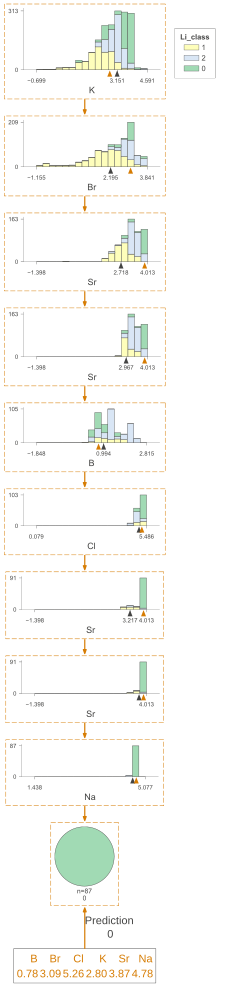

In [34]:
viz_model.view(x=x, show_just_path=True)

In [35]:
viz_model.view(x=x).save('dviz/rf_tree0_prediction_path.svg')
viz_model.view(x=x, show_just_path=True).save('dviz/rf_tree0_prediction_only_path.svg')

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/dtreeviz/models/shadow_decision_tree.py:335: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/dtreeviz/trees.py:1231: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/dtreeviz/models/shadow_decision_tree.py:335: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). T

## Leaf info

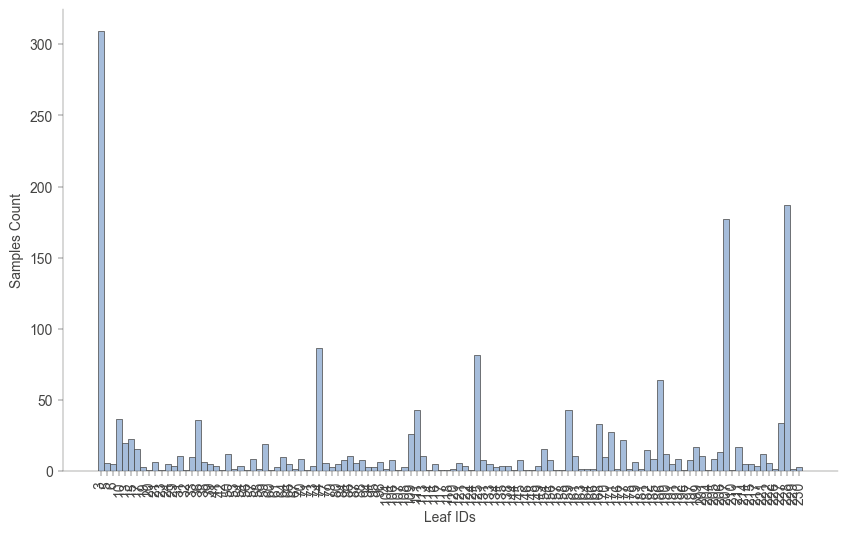

In [36]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(10, 6))
plt.setp(ax.get_xticklabels(), rotation=90)
viz_model.leaf_sizes(ax=ax)

# Save the plot to a file
plt.savefig('dviz/rf_tree0_leaf_sizes_plot.png', bbox_inches='tight')

# Display the plot
plt.show()

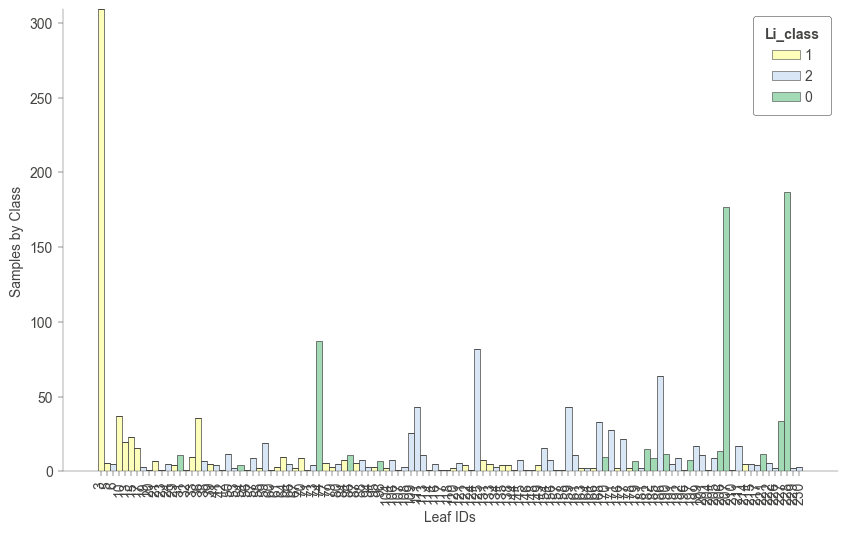

In [63]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(10, 6))
plt.setp(ax.get_xticklabels(), rotation=90)
viz_model.ctree_leaf_distributions(ax=ax)
plt.savefig('dviz/rf_tree0_leaf_dist.png', bbox_inches='tight')
plt.savefig('dviz/rf_tree0_leaf_dist.svg', bbox_inches='tight')
plt.show()

## Classifier Feature Space

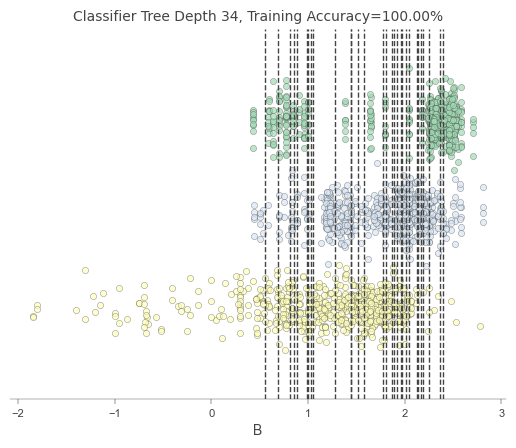

In [38]:
viz_model.ctree_feature_space(show={'splits','title'}, features=['B'])

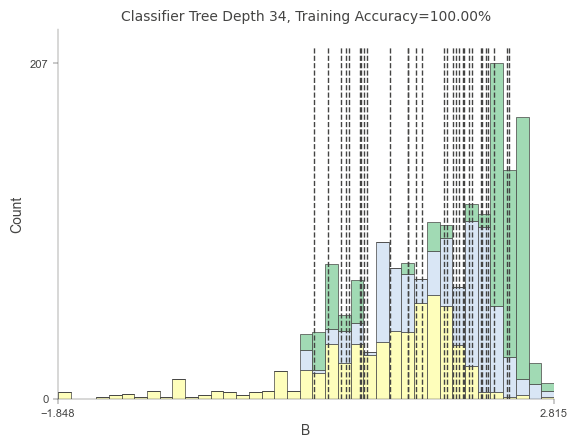

In [39]:
viz_model.ctree_feature_space(nbins=40, gtype='barstacked', show={'splits','title'}, features=['B'])

# SHAP

In [75]:
import shap
import os
import matplotlib.pyplot as plt
from art.estimators.classification import SklearnClassifier

data = resampled_df

# Split into features and target
X = data[['B', 'Br', 'Cl', 'K', 'Sr', 'Na']]
y = data['Li_class']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Convert to numpy arrays
X_train_np = X_train.to_numpy()
X_test_np = X_test.to_numpy()
y_train_np = y_train.to_numpy()
y_test_np = y_test.to_numpy()

# Initialize and train the model
extra_trees_model = ExtraTreesClassifier(**best_params['ExtraTrees'], random_state=259)
extra_trees_model.fit(X_train_np, y_train_np)


os.makedirs('shap', exist_ok=True)

# Initialize the SHAP TreeExplainer for the Extra Trees model
explainer = shap.TreeExplainer(extra_trees_model)

shap_values = explainer.shap_values(X_train)

In [76]:
print(f"SHAP Values Shape: {np.array(shap_values).shape}")
print(f"Feature Names: {X_train.columns.tolist()}")


SHAP Values Shape: (1440, 6, 3)
Feature Names: ['B', 'Br', 'Cl', 'K', 'Sr', 'Na']


Aggregated SHAP values shape: (1440, 6)
SHAP summary plot saved as 'shap/summary_plot.png'


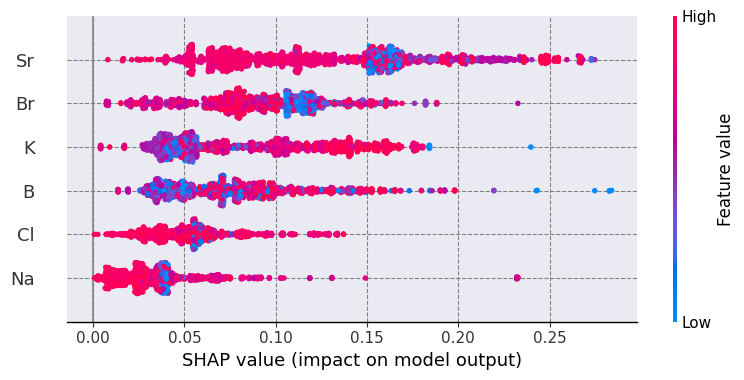

In [82]:
import numpy as np
import shap
import matplotlib.pyplot as plt

# Aggregate SHAP values across classes (averaging over axis=2)
shap_values_mean = np.mean(np.abs(shap_values), axis=2)
print("Aggregated SHAP values shape:", shap_values_mean.shape)  # Should output (1440, 6)

# Generate SHAP summary plot
shap.summary_plot(shap_values_mean, X_train, max_display=6, show=False)

fig = plt.gcf()
fig.savefig("shap/summary_plot.png", format="png", bbox_inches="tight", dpi=300)

print("SHAP summary plot saved as 'shap/summary_plot.png'")

# Permutation Feature Importance

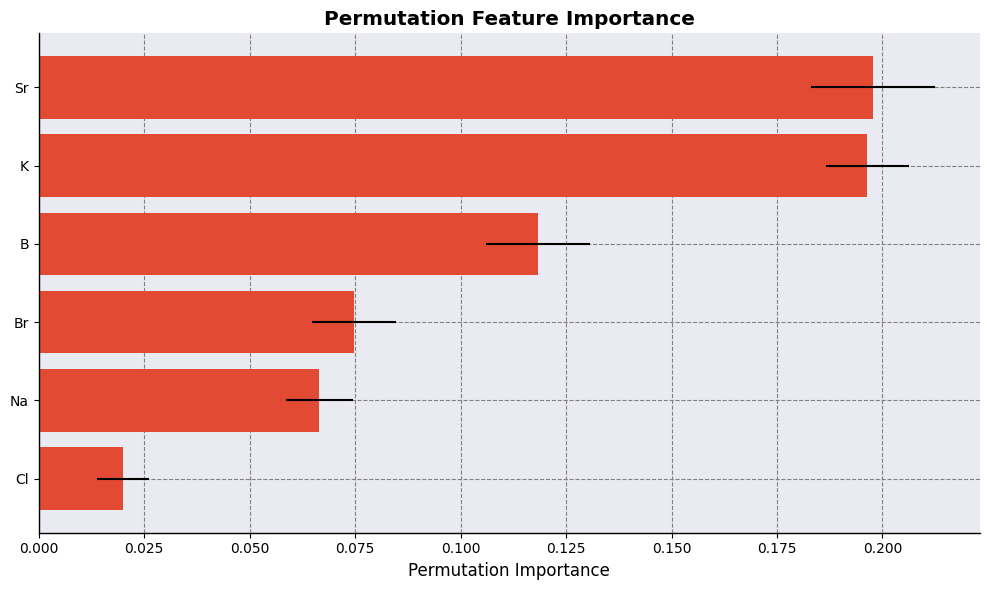

In [83]:
import os
import matplotlib.pyplot as plt
from sklearn.inspection import permutation_importance

# Create a directory to save plots
os.makedirs('pfi', exist_ok=True)

etm = extra_trees_model.fit(X_train, y_train)

perm_importance = permutation_importance(etm, X_val, y_val,
                                           n_repeats=10, random_state=42)

# Sort the feature importances in ascending order
sorted_idx = perm_importance.importances_mean.argsort()

plt.figure(figsize=(10, 6))
plt.barh(range(len(sorted_idx)),
         perm_importance.importances_mean[sorted_idx],
         xerr=perm_importance.importances_std[sorted_idx],
         align='center')
plt.yticks(range(len(sorted_idx)), X_val.columns[sorted_idx])
plt.xlabel("Permutation Importance")
plt.title("Permutation Feature Importance")
plt.tight_layout()
plt.savefig("pfi/permutation_importance.png")



# LIME

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but ExtraTreesClassifier was fitted with feature names


LIME plot saved: lime/lime_explanation_0.png


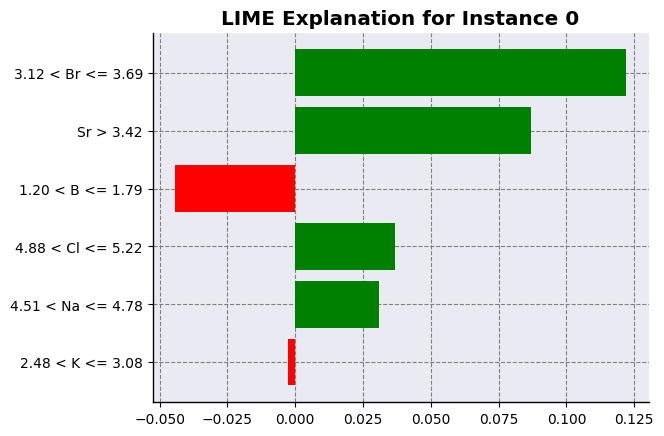

In [84]:
import os
import numpy as np
import lime
import lime.lime_tabular
import matplotlib.pyplot as plt

# Ensure directory exists
os.makedirs('lime', exist_ok=True)

# Create LIME Explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train.values,   # Use values to avoid Pandas-related issues
    feature_names=X_train.columns.tolist(),
    class_names=np.unique(y_train).astype(str).tolist(),  # Convert class labels to strings
    mode="classification",
    discretize_continuous=True
)

# Select an instance from the test set to explain
instance_idx = 0  # Change this index to analyze different instances
instance = X_test.iloc[instance_idx].values.reshape(1, -1)

# Generate explanation for the selected instance
exp = explainer.explain_instance(
    data_row=instance.flatten(),
    predict_fn=extra_trees_model.predict_proba  # Use the model's probability output
)

# Save LIME explanation plot
lime_fig = exp.as_pyplot_figure()
plt.title(f"LIME Explanation for Instance {instance_idx}")
lime_fig.savefig(f"lime/lime_explanation_{instance_idx}.png")

print(f"LIME plot saved: lime/lime_explanation_{instance_idx}.png")


# Extra Trees Robustness Tests

In [40]:
from art.estimators.classification import SklearnClassifier
from art.attacks.evasion import HopSkipJump

data = resampled_df

# Split into features and target
X = data[['B', 'Br', 'Cl', 'K', 'Sr', 'Na']]
y = data['Li_class']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Convert to numpy arrays
X_train_np = X_train.to_numpy()
X_test_np = X_test.to_numpy()
y_train_np = y_train.to_numpy()
y_test_np = y_test.to_numpy()

# Initialize and train the model
model = ExtraTreesClassifier(**best_params['ExtraTrees'], random_state=259)
model.fit(X_train_np, y_train_np)

# Convert XGBoost model to ART classifier
art_model = SklearnClassifier(model=model)

In [41]:
from art.attacks.evasion import HopSkipJump
from sklearn.metrics import accuracy_score, classification_report, precision_recall_fscore_support
import numpy as np

# Set up the HopSkipJump attack
attack = HopSkipJump(
    classifier=art_model,
    batch_size=4,
    targeted=False,
    norm=2,
    max_iter=1,  # Increase to allow more iterations
    max_eval=1,  # Increase to allow more evaluations
    init_eval=1,  # Increase for more initial evaluations
    init_size=1,  # Increase for more trials in initial generation
    verbose=True
)

# Generate adversarial examples
X_test_adv = attack.generate(x=X_test_np)

# Predict on adversarial examples
y_pred_adv = model.predict(X_test_adv)

# Metrics for the attacked model
accuracy_adv = accuracy_score(y_test_np, y_pred_adv)
precision_adv, recall_adv, f1_adv, _ = precision_recall_fscore_support(y_test_np, y_pred_adv, average="weighted")
print(f"Metrics after attack:")
print(f"Accuracy: {accuracy_adv:.6f}")
print(f"Precision: {precision_adv:.6f}")
print(f"Recall: {recall_adv:.6f}")
print(f"F1-Score: {f1_adv:.6f}")
print(classification_report(y_test_np, y_pred_adv))

# Retrain model with adversarial examples (if needed for defense)
X_train_combined = np.concatenate((X_train_np, X_test_adv), axis=0)
y_train_combined = np.concatenate((y_train_np, y_pred_adv), axis=0)

model_defended = ExtraTreesClassifier()
model_defended.fit(X_train_combined, y_train_combined)

# Predict on the test set again
y_pred_defended = model_defended.predict(X_test_np)

# Metrics for the defended model
accuracy_defended = accuracy_score(y_test_np, y_pred_defended)
precision_defended, recall_defended, f1_defended, _ = precision_recall_fscore_support(y_test_np, y_pred_defended, average="weighted")
print(f"\nMetrics after defense:")
print(f"Accuracy: {accuracy_defended:.6f}")
print(f"Precision: {precision_defended:.6f}")
print(f"Recall: {recall_defended:.6f}")
print(f"F1-Score: {f1_defended:.6f}")
print(classification_report(y_test_np, y_pred_defended))


HopSkipJump: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 541/541 [00:24<00:00, 21.80it/s]

Metrics after attack:
Accuracy: 0.327172
Precision: 0.353849
Recall: 0.327172
F1-Score: 0.241091
              precision    recall  f1-score   support

           0       0.47      0.87      0.61       175
           1       0.11      0.12      0.11       188
           2       0.50      0.01      0.01       178

    accuracy                           0.33       541
   macro avg       0.36      0.33      0.25       541
weighted avg       0.35      0.33      0.24       541


Metrics after defense:
Accuracy: 0.977819
Precision: 0.978136
Recall: 0.977819
F1-Score: 0.977800
              precision    recall  f1-score   support

           0       0.98      0.95      0.97       175
           1       0.95      0.98      0.97       188
           2       1.00      1.00      1.00       178

    accuracy                           0.98       541
   macro avg       0.98      0.98      0.98       541
weighted avg       0.98      0.98      0.98       541



Accuracy after defense: 0.9796672828096118
Classification Report after defense:
              precision    recall  f1-score   support

           0       0.98      0.95      0.97       175
           1       0.96      0.98      0.97       188
           2       1.00      1.00      1.00       178

    accuracy                           0.98       541
   macro avg       0.98      0.98      0.98       541
weighted avg       0.98      0.98      0.98       541



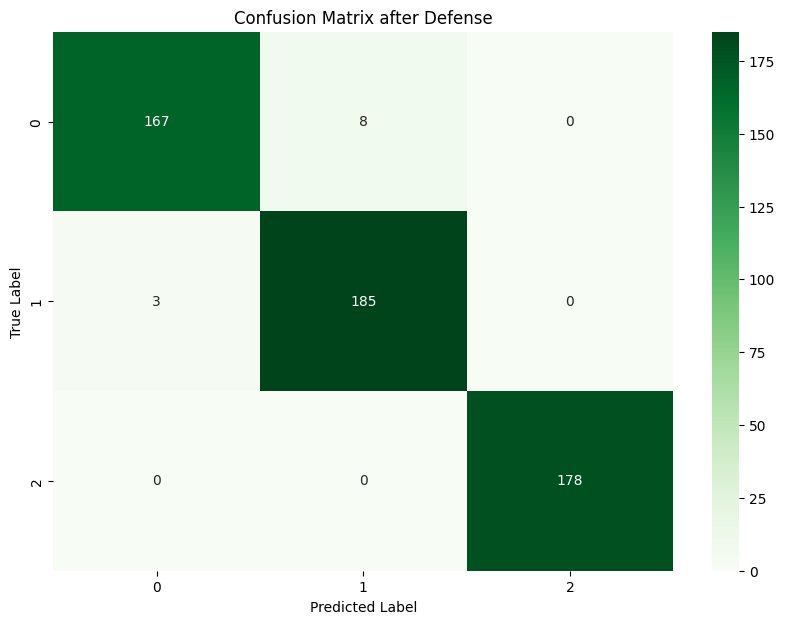

In [42]:
# Retrain model with adversarial examples (if needed for defense)
X_train_combined = np.concatenate((X_train_np, X_test_adv), axis=0)
y_train_combined = np.concatenate((y_train_np, y_pred_adv), axis=0)

model_defended = ExtraTreesClassifier()
model_defended.fit(X_train_combined, y_train_combined)

# Predict on the test set again
y_pred_defended = model_defended.predict(X_test_np)

# Log metrics for the defended model
accuracy_defended = accuracy_score(y_test_np, y_pred_defended)
print(f'Accuracy after defense: {accuracy_defended}')
print("Classification Report after defense:")
print(classification_report(y_test_np, y_pred_defended))

# Confusion Matrix for defended model
cm_defended = confusion_matrix(y_test_np, y_pred_defended)
plt.figure(figsize=(10, 7))
sns.heatmap(cm_defended, annot=True, fmt='d', cmap='Greens')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix after Defense')
plt.show()


In [43]:
from art.attacks.evasion import ZooAttack

# Set up the ZOO attack
attack = ZooAttack(
    classifier=art_model,
    confidence=0.5,
    targeted=False,
    learning_rate=1e-1,
    max_iter=1,
    binary_search_steps=1,
    initial_const=1e-1,
    abort_early=True,
    use_resize=False,
    use_importance=False,
    nb_parallel=1,
    batch_size=1,
    variable_h=0.01,
)


# Generate adversarial examples
X_test_adv = attack.generate(x=X_test_np)

# Predict on adversarial examples
y_pred_adv = model.predict(X_test_adv)

# Metrics for the attacked model
accuracy_adv = accuracy_score(y_test_np, y_pred_adv)
precision_adv, recall_adv, f1_adv, _ = precision_recall_fscore_support(y_test_np, y_pred_adv, average="weighted")
print(f"Metrics after attack:")
print(f"Accuracy: {accuracy_adv:.6f}")
print(f"Precision: {precision_adv:.6f}")
print(f"Recall: {recall_adv:.6f}")
print(f"F1-Score: {f1_adv:.6f}")
print(classification_report(y_test_np, y_pred_adv))

# Retrain model with adversarial examples (if needed for defense)
X_train_combined = np.concatenate((X_train_np, X_test_adv), axis=0)
y_train_combined = np.concatenate((y_train_np, y_pred_adv), axis=0)

model_defended = ExtraTreesClassifier()
model_defended.fit(X_train_combined, y_train_combined)

# Predict on the test set again
y_pred_defended = model_defended.predict(X_test_np)

# Metrics for the defended model
accuracy_defended = accuracy_score(y_test_np, y_pred_defended)
precision_defended, recall_defended, f1_defended, _ = precision_recall_fscore_support(y_test_np, y_pred_defended, average="weighted")
print(f"\nMetrics after defense:")
print(f"Accuracy: {accuracy_defended:.6f}")
print(f"Precision: {precision_defended:.6f}")
print(f"Recall: {recall_defended:.6f}")
print(f"F1-Score: {f1_defended:.6f}")
print(classification_report(y_test_np, y_pred_defended))

ZOO: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 541/541 [00:03<00:00, 154.41it/s]


Metrics after attack:
Accuracy: 0.966728
Precision: 0.967540
Recall: 0.966728
F1-Score: 0.966780
              precision    recall  f1-score   support

           0       0.98      0.94      0.96       175
           1       0.93      0.98      0.96       188
           2       0.99      0.98      0.99       178

    accuracy                           0.97       541
   macro avg       0.97      0.97      0.97       541
weighted avg       0.97      0.97      0.97       541


Metrics after defense:
Accuracy: 0.974122
Precision: 0.974530
Recall: 0.974122
F1-Score: 0.974042
              precision    recall  f1-score   support

           0       0.98      0.94      0.96       175
           1       0.95      0.98      0.97       188
           2       0.99      1.00      1.00       178

    accuracy                           0.97       541
   macro avg       0.98      0.97      0.97       541
weighted avg       0.97      0.97      0.97       541



In [44]:
from art.attacks.evasion import BoundaryAttack

# Set up the attack
attack = BoundaryAttack(
    estimator=art_model,
     targeted=False, max_iter=0, delta=0.001, epsilon=0.001
)


# Generate adversarial examples
X_test_adv = attack.generate(x=X_test_np)

# Predict on adversarial examples
y_pred_adv = model.predict(X_test_adv)

# Log metrics for the attacked model
accuracy_adv = accuracy_score(y_test_np, y_pred_adv)
print(f'Accuracy after attack: {accuracy_adv}')
print(classification_report(y_test_np, y_pred_adv))



Boundary attack:   0%|                                                                                                                                                            | 0/541 [00:00<?, ?it/s]
Boundary attack - iterations: 0it [00:00, ?it/s]

Boundary attack - iterations: 0it [00:00, ?it/s]

Boundary attack - iterations: 0it [00:00, ?it/s]

Boundary attack - iterations: 0it [00:00, ?it/s]

Boundary attack - iterations: 0it [00:00, ?it/s]

Boundary attack - iterations: 0it [00:00, ?it/s]

Boundary attack - iterations: 0it [00:00, ?it/s]

Boundary attack - iterations: 0it [00:00, ?it/s]

Boundary attack - iterations: 0it [00:00, ?it/s]
Boundary attack:   2%|██▍                                                                                                                                                 | 9/541 [00:00<00:06, 86.65it/s]
Boundary attack - iterations: 0it [00:00, ?it/s]

Boundary attack - iterations: 0it [00:00, ?it/s]

Boundary attack - iterations: 0it [00:00, ?it

Accuracy after attack: 0.024029574861367836
              precision    recall  f1-score   support

           0       0.03      0.06      0.04       175
           1       0.02      0.02      0.02       188
           2       0.00      0.00      0.00       178

    accuracy                           0.02       541
   macro avg       0.02      0.02      0.02       541
weighted avg       0.01      0.02      0.02       541



In [45]:
# Metrics for the attacked model
accuracy_adv = accuracy_score(y_test_np, y_pred_adv)
precision_adv, recall_adv, f1_adv, _ = precision_recall_fscore_support(y_test_np, y_pred_adv, average="weighted")
print(f"Metrics after attack:")
print(f"Accuracy: {accuracy_adv:.6f}")
print(f"Precision: {precision_adv:.6f}")
print(f"Recall: {recall_adv:.6f}")
print(f"F1-Score: {f1_adv:.6f}")
print(classification_report(y_test_np, y_pred_adv))

Metrics after attack:
Accuracy: 0.024030
Precision: 0.014969
Recall: 0.024030
F1-Score: 0.017903
              precision    recall  f1-score   support

           0       0.03      0.06      0.04       175
           1       0.02      0.02      0.02       188
           2       0.00      0.00      0.00       178

    accuracy                           0.02       541
   macro avg       0.02      0.02      0.02       541
weighted avg       0.01      0.02      0.02       541



In [46]:
import numpy as np
from art.attacks.inference.membership_inference import MembershipInferenceBlackBoxRuleBased

# Set up the attack
attack = MembershipInferenceBlackBoxRuleBased(art_model)

# Infer membership
inferred_train = attack.infer(X_train, y_train)
inferred_test = attack.infer(X_test, y_test)

# Calculate accuracy
train_acc = np.sum(inferred_train) / len(inferred_train)
test_acc = 1 - (np.sum(inferred_test) / len(inferred_test))
overall_acc = (train_acc * len(inferred_train) + test_acc * len(inferred_test)) / (len(inferred_train) + len(inferred_test))

print(f"Members Accuracy: {train_acc:.6f}")
print(f"Non Members Accuracy: {test_acc:.6f}")
print(f"Attack Accuracy: {overall_acc:.6f}")

# Define precision, recall, and F1-score function
def calc_precision_recall_f1(predicted, actual, positive_value=1):
    tp = np.sum((predicted == positive_value) & (actual == positive_value))  # True positives
    fp = np.sum((predicted == positive_value) & (actual != positive_value))  # False positives
    fn = np.sum((predicted != positive_value) & (actual == positive_value))  # False negatives

    precision = tp / (tp + fp) if (tp + fp) > 0 else 1.0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 1.0
    f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0.0

    return precision, recall, f1

# Prepare true labels (1 for train members, 0 for non-members)
true_labels = np.concatenate((np.ones(len(inferred_train)), np.zeros(len(inferred_test))))
predicted_labels = np.concatenate((inferred_train, inferred_test))

# Calculate precision, recall, and F1-score
precision, recall, f1 = calc_precision_recall_f1(predicted_labels, true_labels)

print(f"Precision: {precision:.6f}")
print(f"Recall: {recall:.6f}")
print(f"F1-Score: {f1:.6f}")


Members Accuracy: 1.000000
Non Members Accuracy: 0.024030
Attack Accuracy: 0.706830
Precision: 0.704698
Recall: 1.000000
F1-Score: 0.826772


In [49]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.ensemble import ExtraTreesClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_recall_fscore_support, classification_report, confusion_matrix

from art.estimators.classification import SklearnClassifier
from art.attacks.evasion import HopSkipJump, ZooAttack, BoundaryAttack
from art.attacks.inference.membership_inference import MembershipInferenceBlackBoxRuleBased

# ---------------------------
# Assumptions: Your preprocessed dataframe 'resampled_df'
# and best_params dict for ExtraTreesClassifier are already defined.
# For example:
# data = resampled_df
# X = data[['B', 'Br', 'Cl', 'K', 'Sr', 'Na']]
# y = data['Li_class']
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
# X_train_np = X_train.to_numpy()
# X_test_np = X_test.to_numpy()
# y_train_np = y_train.to_numpy()
# y_test_np = y_test.to_numpy()
# ---------------------------

# Train the base model
model = ExtraTreesClassifier(**best_params['ExtraTrees'], random_state=259)
model.fit(X_train_np, y_train_np)
art_model = SklearnClassifier(model=model)

# List to store metrics from each experiment
results = []

# -------------------------
# 1. HopSkipJump Attack and Defense
# -------------------------
attack_hsj = HopSkipJump(
    classifier=art_model,
    batch_size=4,
    targeted=False,
    norm=2,
    max_iter=1,    # Increase as needed
    max_eval=1,    # Increase as needed
    init_eval=1,   # Increase as needed
    init_size=1,   # Increase as needed
    verbose=True
)
# Generate adversarial examples using HopSkipJump
X_test_adv_hsj = attack_hsj.generate(x=X_test_np)
y_pred_adv_hsj = model.predict(X_test_adv_hsj)

# Compute metrics for the attack
accuracy_hsj = accuracy_score(y_test_np, y_pred_adv_hsj)
precision_hsj, recall_hsj, f1_hsj, _ = precision_recall_fscore_support(
    y_test_np, y_pred_adv_hsj, average="weighted"
)
results.append({
    "attack/defence name": "HopSkipJump Attack",
    "type": "attack",
    "accuracy": accuracy_hsj,
    "precision": precision_hsj,
    "recall": recall_hsj,
    "f1": f1_hsj
})

# Retrain a defended model using the adversarial examples
X_train_combined_hsj = np.concatenate((X_train_np, X_test_adv_hsj), axis=0)
y_train_combined_hsj = np.concatenate((y_train_np, y_pred_adv_hsj), axis=0)
model_defended_hsj = ExtraTreesClassifier()
model_defended_hsj.fit(X_train_combined_hsj, y_train_combined_hsj)
y_pred_defended_hsj = model_defended_hsj.predict(X_test_np)

# Compute defense metrics
accuracy_hsj_def = accuracy_score(y_test_np, y_pred_defended_hsj)
precision_hsj_def, recall_hsj_def, f1_hsj_def, _ = precision_recall_fscore_support(
    y_test_np, y_pred_defended_hsj, average="weighted"
)
results.append({
    "attack/defence name": "HopSkipJump Defense",
    "type": "defence",
    "accuracy": accuracy_hsj_def,
    "precision": precision_hsj_def,
    "recall": recall_hsj_def,
    "f1": f1_hsj_def
})

# -------------------------
# 2. ZooAttack and Defense
# -------------------------
attack_zoo = ZooAttack(
    classifier=art_model,
    confidence=0.5,
    targeted=False,
    learning_rate=1e-1,
    max_iter=1,    # Increase as needed
    binary_search_steps=1,
    initial_const=1e-1,
    abort_early=True,
    use_resize=False,
    use_importance=False,
    nb_parallel=1,
    batch_size=1,
    variable_h=0.01,
)
X_test_adv_zoo = attack_zoo.generate(x=X_test_np)
y_pred_adv_zoo = model.predict(X_test_adv_zoo)

accuracy_zoo = accuracy_score(y_test_np, y_pred_adv_zoo)
precision_zoo, recall_zoo, f1_zoo, _ = precision_recall_fscore_support(
    y_test_np, y_pred_adv_zoo, average="weighted"
)
results.append({
    "attack/defence name": "ZooAttack Attack",
    "type": "attack",
    "accuracy": accuracy_zoo,
    "precision": precision_zoo,
    "recall": recall_zoo,
    "f1": f1_zoo
})

# Defense: Retrain model with ZooAttack adversarial examples
X_train_combined_zoo = np.concatenate((X_train_np, X_test_adv_zoo), axis=0)
y_train_combined_zoo = np.concatenate((y_train_np, y_pred_adv_zoo), axis=0)
model_defended_zoo = ExtraTreesClassifier()
model_defended_zoo.fit(X_train_combined_zoo, y_train_combined_zoo)
y_pred_defended_zoo = model_defended_zoo.predict(X_test_np)

accuracy_zoo_def = accuracy_score(y_test_np, y_pred_defended_zoo)
precision_zoo_def, recall_zoo_def, f1_zoo_def, _ = precision_recall_fscore_support(
    y_test_np, y_pred_defended_zoo, average="weighted"
)
results.append({
    "attack/defence name": "ZooAttack Defense",
    "type": "defence",
    "accuracy": accuracy_zoo_def,
    "precision": precision_zoo_def,
    "recall": recall_zoo_def,
    "f1": f1_zoo_def
})

# -------------------------
# 3. Boundary Attack
# -------------------------
attack_boundary = BoundaryAttack(
    estimator=art_model,
    targeted=False,
    max_iter=0,    # Set to desired number of iterations
    delta=0.001,
    epsilon=0.001
)
X_test_adv_boundary = attack_boundary.generate(x=X_test_np)
y_pred_adv_boundary = model.predict(X_test_adv_boundary)

accuracy_boundary = accuracy_score(y_test_np, y_pred_adv_boundary)
precision_boundary, recall_boundary, f1_boundary, _ = precision_recall_fscore_support(
    y_test_np, y_pred_adv_boundary, average="weighted"
)
results.append({
    "attack/defence name": "Boundary Attack",
    "type": "attack",
    "accuracy": accuracy_boundary,
    "precision": precision_boundary,
    "recall": recall_boundary,
    "f1": f1_boundary
})

# -------------------------
# 4. Membership Inference Attack
# -------------------------
attack_mi = MembershipInferenceBlackBoxRuleBased(art_model)
inferred_train = attack_mi.infer(X_train, y_train)
inferred_test = attack_mi.infer(X_test, y_test)

# Calculate overall membership attack accuracy
train_acc = np.sum(inferred_train) / len(inferred_train)
test_acc = 1 - (np.sum(inferred_test) / len(inferred_test))
overall_acc_mi = (train_acc * len(inferred_train) + test_acc * len(inferred_test)) / (len(inferred_train) + len(inferred_test))

# Define custom function to calculate precision, recall, and F1-score
def calc_precision_recall_f1(predicted, actual, positive_value=1):
    tp = np.sum((predicted == positive_value) & (actual == positive_value))
    fp = np.sum((predicted == positive_value) & (actual != positive_value))
    fn = np.sum((predicted != positive_value) & (actual == positive_value))
    precision = tp / (tp + fp) if (tp + fp) > 0 else 1.0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 1.0
    f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0.0
    return precision, recall, f1

# Prepare labels: 1 for training (members) and 0 for testing (non-members)
true_labels_mi = np.concatenate((np.ones(len(inferred_train)), np.zeros(len(inferred_test))))
predicted_labels_mi = np.concatenate((inferred_train, inferred_test))
precision_mi, recall_mi, f1_mi = calc_precision_recall_f1(predicted_labels_mi, true_labels_mi)

results.append({
    "attack/defence name": "Membership Inference Attack",
    "type": "attack",
    "accuracy": overall_acc_mi,
    "precision": precision_mi,
    "recall": recall_mi,
    "f1": f1_mi
})

# -------------------------
# Create DataFrame from results and export as CSV
# -------------------------
df_metrics = pd.DataFrame(results)
df_metrics.to_csv("metrics/attack_defense_metrics.csv", index=False)
print("Metrics exported to 'attack_defense_metrics.csv':\n", df_metrics)


Boundary attack:   0%|                                                                                                                                                            | 0/541 [00:00<?, ?it/s]
Boundary attack - iterations: 0it [00:00, ?it/s]

Boundary attack - iterations: 0it [00:00, ?it/s]

Boundary attack - iterations: 0it [00:00, ?it/s]

Boundary attack - iterations: 0it [00:00, ?it/s]

Boundary attack - iterations: 0it [00:00, ?it/s]

Boundary attack - iterations: 0it [00:00, ?it/s]

Boundary attack - iterations: 0it [00:00, ?it/s]

Boundary attack - iterations: 0it [00:00, ?it/s]

Boundary attack - iterations: 0it [00:00, ?it/s]

Boundary attack - iterations: 0it [00:00, ?it/s]
Boundary attack:   2%|██▋                                                                                                                                                | 10/541 [00:00<00:05, 96.48it/s]
Boundary attack - iterations: 0it [00:00, ?it/s]

Boundary attack - iterations: 0it [00:00, ?it

Metrics exported to 'attack_defense_metrics.csv':
            attack/defence name     type  accuracy  precision    recall  \
0           HopSkipJump Attack   attack  0.330869   0.521158  0.330869   
1          HopSkipJump Defense  defence  0.979667   0.979887  0.979667   
2             ZooAttack Attack   attack  0.974122   0.974520  0.974122   
3            ZooAttack Defense  defence  0.977819   0.978136  0.977819   
4              Boundary Attack   attack  0.024030   0.014809  0.024030   
5  Membership Inference Attack   attack  0.706830   0.704698  1.000000   

         f1  
0  0.244184  
1  0.979653  
2  0.974170  
3  0.977800  
4  0.017910  
5  0.826772  


# Visualisations

/var/folders/2l/q8wm67_x5yn9qtfylfw_gktc0000gn/T/ipykernel_31507/2722014126.py:7: DtypeWarning: Columns (1,10,18,21,22,24,25,26,27,28,33,35,39,44,45,46,203,205,207) have mixed types. Specify dtype option on import or set low_memory=False.


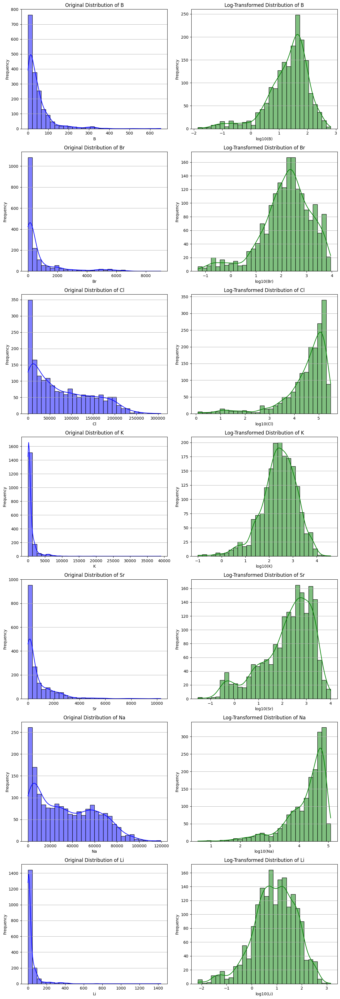

In [47]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load dataset
df = pd.read_csv('data.csv')
# Select relevant columns
df = df[['B', 'Br', 'Cl', 'K', 'Sr', 'Na', 'Li']]

# Data preprocessing
# Drop rows with any NaN values
df = df.dropna(axis=0, how='any')

bins = [0, 700, 2000, float('inf')]
labels = ['low', 'medium', 'high']
df['Li_class'] = pd.cut(df['Li'], bins=bins, labels=labels, right=False)

# Map class labels to integers
df['Li_class'] = df['Li_class'].map({'low': 0, 'medium': 1, 'high': 2}).astype(int)

# Preserve the Na_class for later (it must stay based on the original 'Na' values)
li_class = df['Li_class'].copy()

# Store original data before log transformation
original_df = df.copy()

# Apply log transformation to the features (except 'Na' and 'Na_class')
df[['B', 'Br', 'Cl', 'K', 'Sr', 'Na', 'Li']] = df[['B', 'Br', 'Cl', 'K', 'Sr', 'Na', 'Li']].apply(np.log10)

# Reassign 'Na_class' back to the dataframe to keep it intact
df['Li_class'] = li_class

# Drop 'Na' column since it's no longer needed
# df = df.drop(columns='Li')
original_df = original_df.drop(columns=['Li_class'])

# Plot distributions side by side
fig, axes = plt.subplots(nrows=len(original_df.columns), ncols=2, figsize=(12, 5 * len(original_df.columns)))

for i, column in enumerate(original_df.columns):
    # Original feature distribution
    sns.histplot(original_df[column], kde=True, bins=30, color='blue', ax=axes[i, 0])
    axes[i, 0].set_title(f'Original Distribution of {column}')
    axes[i, 0].set_xlabel(column)
    axes[i, 0].set_ylabel('Frequency')
    axes[i, 0].grid(axis='y')
    
    # Log-transformed feature distribution
    sns.histplot(df[column], kde=True, bins=30, color='green', ax=axes[i, 1])
    axes[i, 1].set_title(f'Log-Transformed Distribution of {column}')
    axes[i, 1].set_xlabel(f'log10({column})')
    axes[i, 1].set_ylabel('Frequency')
    axes[i, 1].grid(axis='y')

plt.tight_layout()
plt.savefig('feature_distributions_comparison.png', dpi=300)
plt.show()


/var/folders/2l/q8wm67_x5yn9qtfylfw_gktc0000gn/T/ipykernel_31507/534798299.py:7: DtypeWarning: Columns (1,10,18,21,22,24,25,26,27,28,33,35,39,44,45,46,203,205,207) have mixed types. Specify dtype option on import or set low_memory=False.


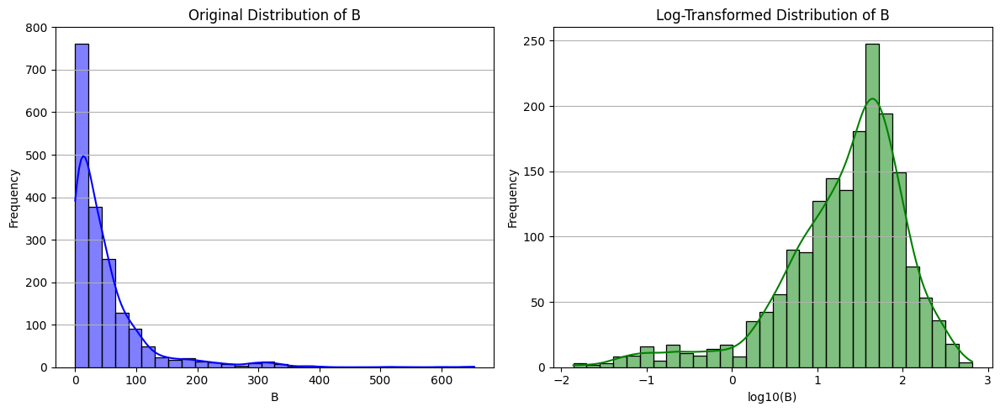

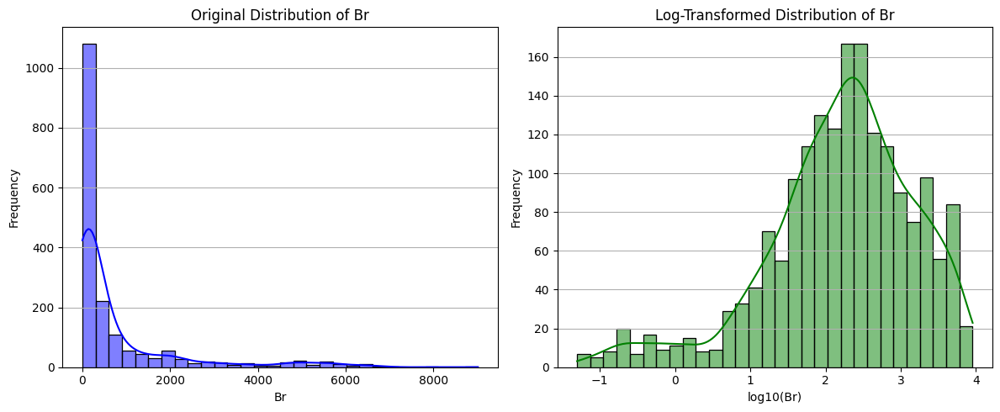

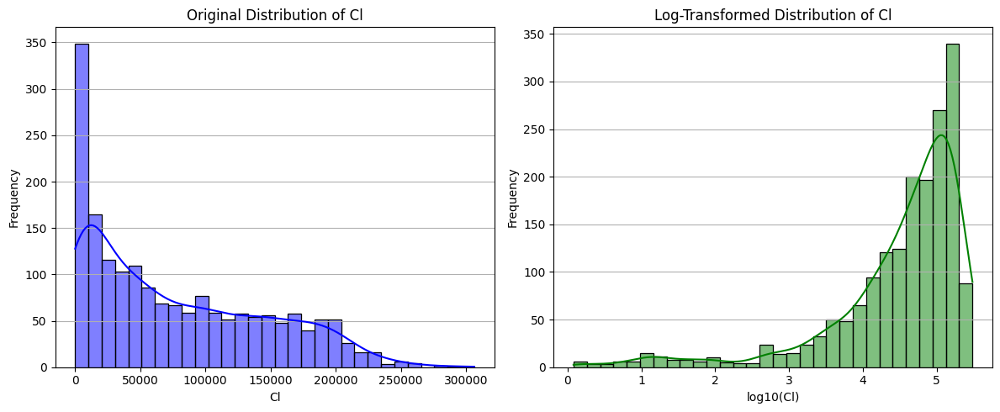

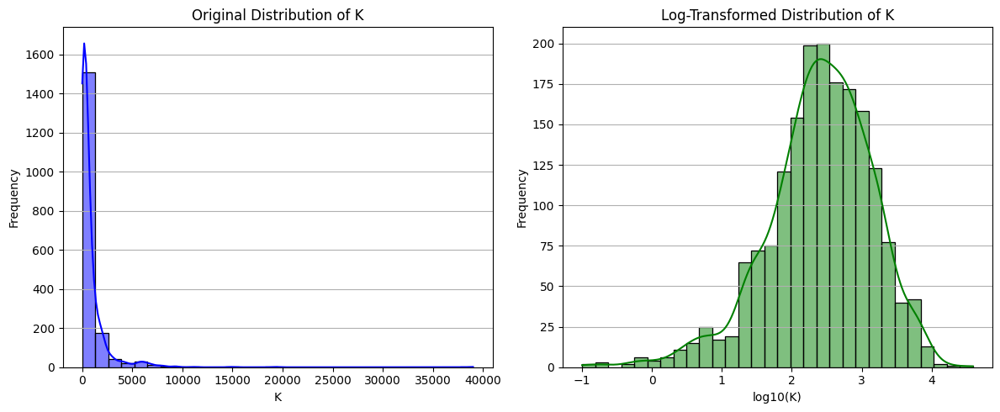

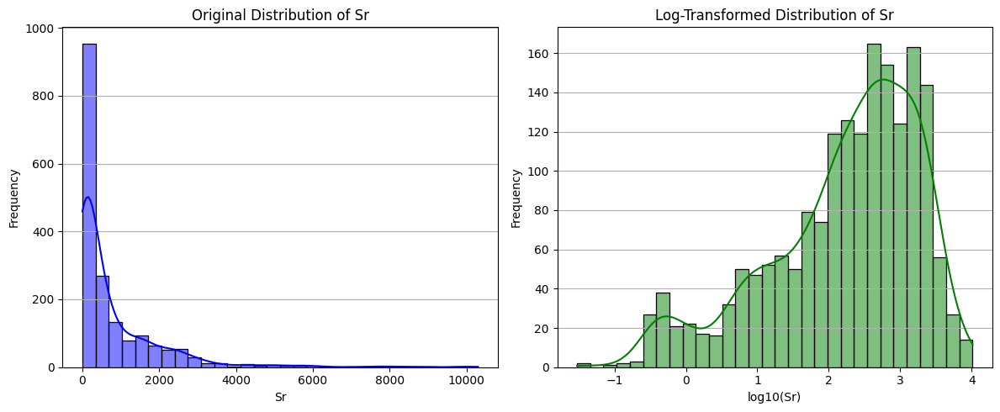

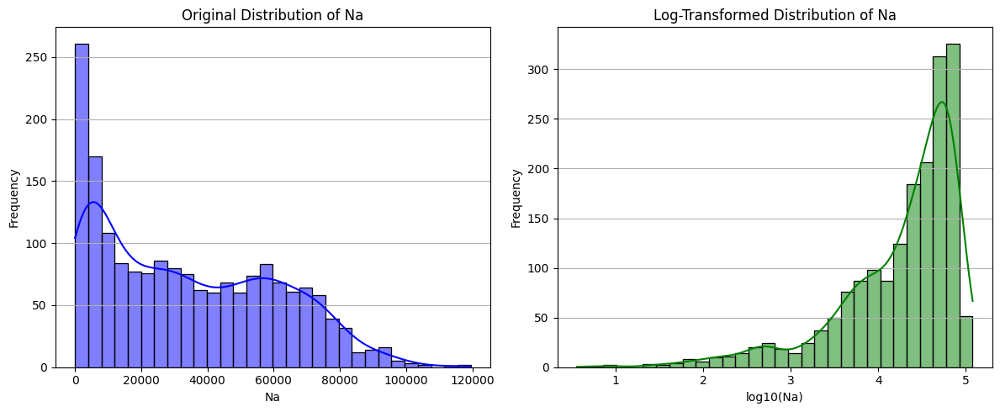

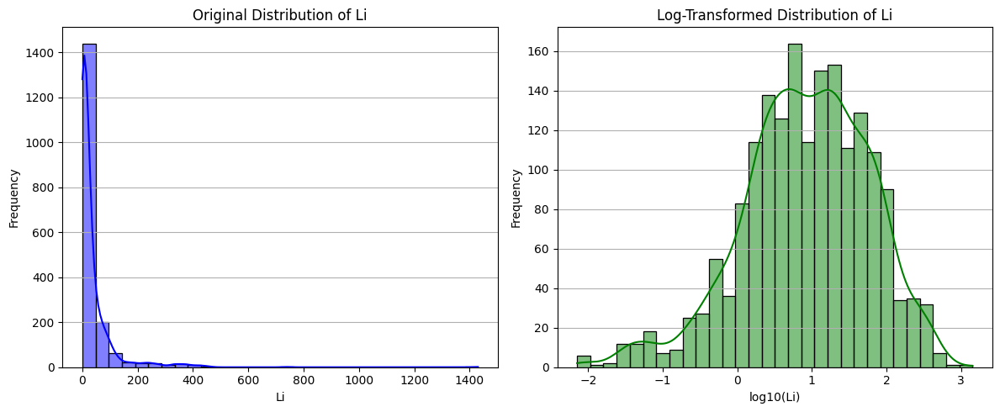

In [48]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load dataset
df = pd.read_csv('data.csv')
# Select relevant columns
df = df[['B', 'Br', 'Cl', 'K', 'Sr', 'Na', 'Li']]

# Data preprocessing
# Drop rows with any NaN values
df = df.dropna(axis=0, how='any')

bins = [0, 700, 2000, float('inf')]
labels = ['low', 'medium', 'high']
df['Li_class'] = pd.cut(df['Li'], bins=bins, labels=labels, right=False)

# Map class labels to integers
df['Li_class'] = df['Li_class'].map({'low': 0, 'medium': 1, 'high': 2}).astype(int)

# Preserve the Li_class for later
li_class = df['Li_class'].copy()

# Store original data before log transformation
original_df = df.copy()

# Apply log transformation to the features (except 'Na' and 'Li_class')
df[['B', 'Br', 'Cl', 'K', 'Sr', 'Na', 'Li']] = df[['B', 'Br', 'Cl', 'K', 'Sr', 'Na', 'Li']].apply(np.log10)

# Reassign 'Li_class' back to the dataframe
df['Li_class'] = li_class

# Drop 'Li_class' from the original copy to only keep numeric columns for plotting
original_df = original_df.drop(columns=['Li_class'])

# Create separate figures for each column
for column in original_df.columns:
    # Create a new figure for each feature
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))
    
    # Original feature distribution
    sns.histplot(original_df[column], kde=True, bins=30, color='blue', ax=axes[0])
    axes[0].set_title(f'Original Distribution of {column}')
    axes[0].set_xlabel(column)
    axes[0].set_ylabel('Frequency')
    axes[0].grid(axis='y')

    # Log-transformed feature distribution
    sns.histplot(df[column], kde=True, bins=30, color='green', ax=axes[1])
    axes[1].set_title(f'Log-Transformed Distribution of {column}')
    axes[1].set_xlabel(f'log10({column})')
    axes[1].set_ylabel('Frequency')
    axes[1].grid(axis='y')

    plt.tight_layout()
    plt.savefig(f'cwd/fd{column}.png', dpi=300)
    plt.show()
